# Flights Data Exploration Challenge
### Completed by Aman Poddar
**Note**: Done as a part of the Microsoft Data Science 30 day challenge


In this challenge, I'll explore a real-world dataset containing flights data from the US Department of Transportation.

Let's start by loading and viewing the data.

In [1]:
import pandas as pd

df_flights = pd.read_csv('data/flights.csv')
df_flights.head()

,Year,Month,DayofMonth,DayOfWeek,Carrier,OriginAirportID,OriginAirportName,OriginCity,OriginState,DestAirportID,DestAirportName,DestCity,DestState,CRSDepTime,DepDelay,DepDel15,CRSArrTime,ArrDelay,ArrDel15,Cancelled
0,2013,9,16,1,DL,15304,Tampa International,Tampa,FL,12478,John F. Kennedy International,New York,NY,1539,4,0.0,1824,13,0,0
1,2013,9,23,1,WN,14122,Pittsburgh International,Pittsburgh,PA,13232,Chicago Midway International,Chicago,IL,710,3,0.0,740,22,1,0
2,2013,9,7,6,AS,14747,Seattle/Tacoma International,Seattle,WA,11278,Ronald Reagan Washington National,Washington,DC,810,-3,0.0,1614,-7,0,0
3,2013,7,22,1,OO,13930,Chicago O'Hare International,Chicago,IL,11042,Cleveland-Hopkins International,Cleveland,OH,804,35,1.0,1027,33,1,0
4,2013,5,16,4,DL,13931,Norfolk International,Norfolk,VA,10397,Hartsfield-Jackson Atlanta International,Atlanta,GA,545,-1,0.0,728,-9,0,0


The dataset contains observations of US domestic flights in 2013, and consists of the following fields:

- **Year**: The year of the flight (all records are from 2013)
- **Month**: The month of the flight
- **DayofMonth**: The day of the month on which the flight departed
- **DayOfWeek**: The day of the week on which the flight departed - from 1 (Monday) to 7 (Sunday)
- **Carrier**: The two-letter abbreviation for the airline.
- **OriginAirportID**: A unique numeric identifier for the departure aiport
- **OriginAirportName**: The full name of the departure airport
- **OriginCity**: The departure airport city
- **OriginState**: The departure airport state
- **DestAirportID**: A unique numeric identifier for the destination aiport
- **DestAirportName**: The full name of the destination airport
- **DestCity**: The destination airport city
- **DestState**: The destination airport state
- **CRSDepTime**: The scheduled departure time
- **DepDelay**: The number of minutes departure was delayed (flight that left ahead of schedule have a negative value)
- **DepDelay15**: A binary indicator that departure was delayed by more than 15 minutes (and therefore considered "late")
- **CRSArrTime**: The scheduled arrival time
- **ArrDelay**: The number of minutes arrival was delayed (flight that arrived ahead of schedule have a negative value)
- **ArrDelay15**: A binary indicator that arrival was delayed by more than 15 minutes (and therefore considered "late")
- **Cancelled**: A binary indicator that the flight was cancelled

My challenge was to explore the flight data to analyze possible factors that affect delays in departure or arrival of a flight.

1. Started by cleaning the data.
    - Identified any null or missing data, and impute appropriate replacement values.
    - Identified and eliminated any outliers in the **DepDelay** and **ArrDelay** columns.
2. Explored the cleaned data.
    - Viewed summary statistics for the numeric fields in the dataset.
    - Determined the distribution of the **DepDelay** and **ArrDelay** columns.
    - Used statistics, aggregate functions, and visualizations to answer the following questions:
        - *What are the average (mean) departure and arrival delays?*
        - *How do the carriers compare in terms of arrival delay performance?*
        - *Is there a noticable difference in arrival delays for different days of the week?*
        - *Which departure airport has the highest average departure delay?*
        - *Do **late** departures tend to result in longer arrival delays than on-time departures?*
        - *Which route (from origin airport to destination airport) has the most **late** arrivals?*
        - *Which route has the highest average arrival delay?*
        

## CLEANING DATA

checking no. of null values for each column, if any.

In [2]:
df_flights.isnull().sum()

Year                    0
Month                   0
DayofMonth              0
DayOfWeek               0
Carrier                 0
OriginAirportID         0
OriginAirportName       0
OriginCity              0
OriginState             0
DestAirportID           0
DestAirportName         0
DestCity                0
DestState               0
CRSDepTime              0
DepDelay                0
DepDel15             2761
CRSArrTime              0
ArrDelay                0
ArrDel15                0
Cancelled               0
dtype: int64

We have quite a number of "null" late departures. Now let us see departure delay column (DepDelay) for all the "null" late departures

In [3]:
df_flights[df_flights.isnull().any(axis=1)][['DepDelay','DepDel15']]

,DepDelay,DepDel15
171,0,NaN
359,0,NaN
429,0,NaN
545,0,NaN
554,0,NaN
...,...,...
271410,0,NaN
271607,0,NaN
271634,0,NaN
271671,0,NaN


Therefore some "null" late departures but it looks like maybe they all have delay in departure (DepDelay) as 0 min. We can verify this by using statistics summary of DepDelay

In [4]:
df_flights[df_flights.isnull().any(axis=1)].DepDelay.describe()

count    2761.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: DepDelay, dtype: float64

Since "min","max", and "mean" all are zeroes, therefore none of the "null" DepDel15 was actually a "late" departure (delay more than 15 min.).
So, now we will replace the missing ("null") DepDel15 values with a "0" and check for missing values again

In [5]:
df_flights.DepDel15 = df_flights.DepDel15.fillna(0)
df_flights.isnull().sum()

Year                 0
Month                0
DayofMonth           0
DayOfWeek            0
Carrier              0
OriginAirportID      0
OriginAirportName    0
OriginCity           0
OriginState          0
DestAirportID        0
DestAirportName      0
DestCity             0
DestState            0
CRSDepTime           0
DepDelay             0
DepDel15             0
CRSArrTime           0
ArrDelay             0
ArrDel15             0
Cancelled            0
dtype: int64

Hence our data is cleaned of any missing values!

## CLEANING ANY OUTLINERS
We will view distribution and statistics summary for DepDelay and ArrDelay

DepDelay 
Minimum=-63.00
Mean=10.35
Median=-1.00
Mode=-3.00
Maximum=1425.00

ArrDelay 
Minimum=-75.00
Mean=6.50
Median=-3.00
Mode=0.00
Maximum=1440.00



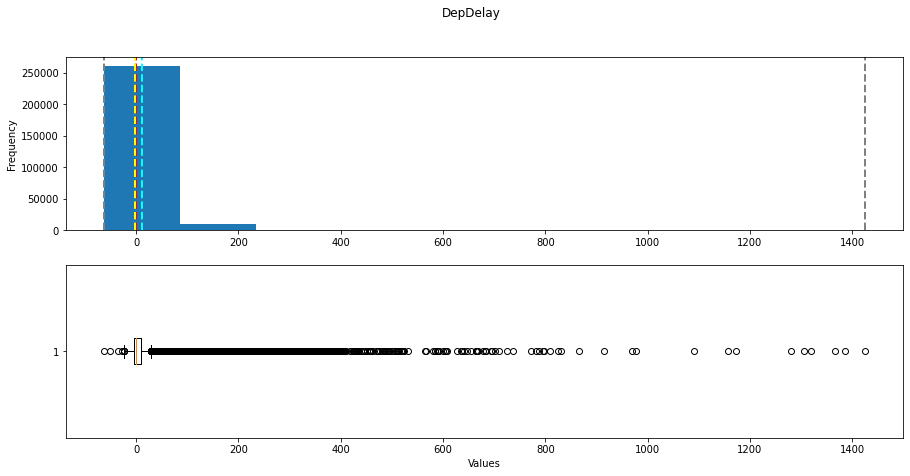

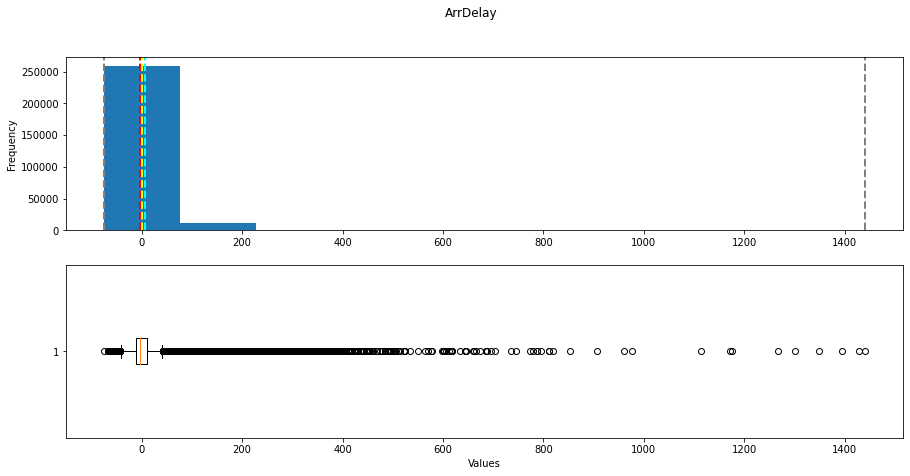

In [6]:
# Function to show sumary stats and distribution for a column
def distribution(var_data):
    from matplotlib import pyplot as plt

    # Soring statistics values
    min_val = var_data.min()
    max_val = var_data.max()
    mean_val = var_data.mean()
    median_val = var_data.median()
    mode_val = var_data.mode()[0]

    print(var_data.name, '\nMinimum={:.2f}\nMean={:.2f}\nMedian={:.2f}\nMode={:.2f}\nMaximum={:.2f}\n'.format(min_val,mean_val,median_val,mode_val,max_val))

    # Figure space for 2 subplots (2 in a row and in 1 column)
    fig, ax = plt.subplots(2,1,figsize = (15,7))

    # Histogram plotting (subplot 1)
    ax[0].hist(var_data)
    ax[0].set_ylabel('Frequency')

    # Adding markings for the mean(cyan), meadian(red), mode(yellow), minimum and maximum (gray)
    ax[0].axvline(x=min_val, color = 'gray', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=mean_val, color = 'cyan', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=median_val, color = 'red', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=mode_val, color = 'yellow', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=max_val, color = 'gray', linestyle='dashed', linewidth = 2)

    # Boxplot plotting (subplot 2)
    ax[1].boxplot(var_data, vert = False)
    ax[1].set_xlabel('Values')

    # Figure title
    fig.suptitle(var_data.name)

    # Show figure
    fig

#Calling the function for delay columns ("DepDelay", "ArrDelay")
delayColumns = ['DepDelay','ArrDelay']
for columns in delayColumns:
    distribution(df_flights[columns])

From the plots it's clear that for both variables, there exist outliners at both the lower and upper ends, and more towards upper end

Therefore we will trim the data so that we will only include rows where values for these fields are within 1st and 90th percentile using quantile function

DepDelay 
Minimum=-11.00
Mean=-0.92
Median=-2.00
Mode=-3.00
Maximum=16.00

ArrDelay 
Minimum=-32.00
Mean=-5.03
Median=-6.00
Mode=0.00
Maximum=37.00



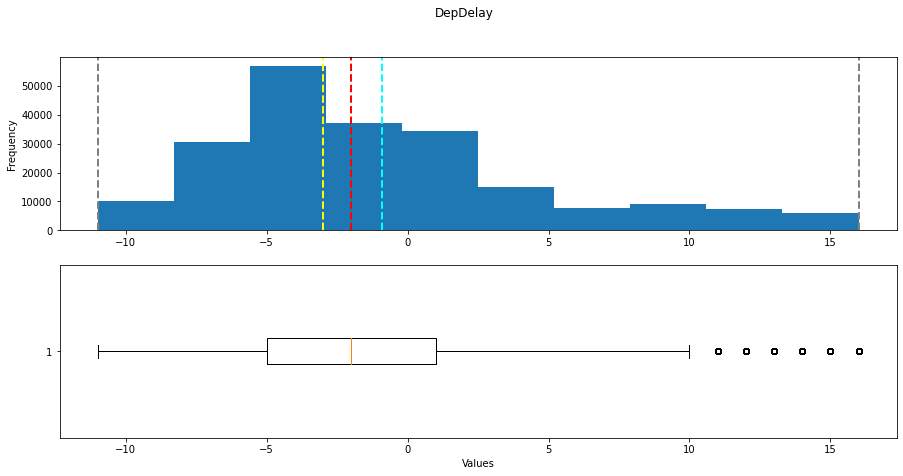

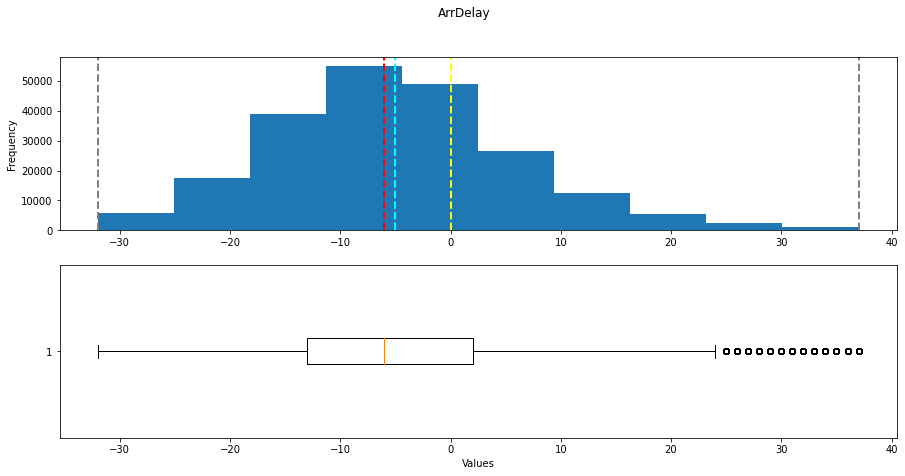

In [7]:
# Trimming outliners for ArrDelay based on 1% and 90% percentiles
ArrDelay_01percentile = df_flights.ArrDelay.quantile(0.01)  #1% percentile
ArrDelay_90percentile = df_flights.ArrDelay.quantile(0.90)  #90% percentile
df_flights = df_flights[df_flights.ArrDelay < ArrDelay_90percentile]
df_flights = df_flights[df_flights.ArrDelay > ArrDelay_01percentile]

# Trimming outliners for DepDelay based on 1% and 90% percentiles
DepDelay_01percentile = df_flights.DepDelay.quantile(0.01)  #1% percentile
DepDelay_90percentile = df_flights.DepDelay.quantile(0.90)  #90% percentile
df_flights = df_flights[df_flights.DepDelay < DepDelay_90percentile]
df_flights = df_flights[df_flights.DepDelay > DepDelay_01percentile]


# trimmed and revised distributions
for columns in delayColumns:
    distribution(df_flights[columns])

This looks much better and a lot of outliners are cleaned

## EXPLORING THE DATA
Let us first view the overall statistics summary for the numeric columns

In [8]:
df_flights.describe()

,Year,Month,DayofMonth,DayOfWeek,OriginAirportID,DestAirportID,CRSDepTime,DepDelay,DepDel15,CRSArrTime,ArrDelay,ArrDel15,Cancelled
count,214397.0,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000,214397.000000
mean,2013.0,7.018368,15.794703,3.902737,12757.827661,12726.276147,1278.223879,-0.921692,0.018116,1461.406596,-5.030276,0.068602,0.013228
std,0.0,2.006398,8.859118,1.997744,1510.058629,1506.251757,469.440262,5.708594,0.133371,485.676457,11.424280,0.252776,0.114249
min,2013.0,4.000000,1.000000,1.000000,10140.000000,10140.000000,1.000000,-11.000000,0.000000,1.000000,-32.000000,0.000000,0.000000
25%,2013.0,5.000000,8.000000,2.000000,11292.000000,11292.000000,850.000000,-5.000000,0.000000,1054.000000,-13.000000,0.000000,0.000000
50%,2013.0,7.000000,16.000000,4.000000,12892.000000,12892.000000,1235.000000,-2.000000,0.000000,1445.000000,-6.000000,0.000000,0.000000
75%,2013.0,9.000000,23.000000,6.000000,14100.000000,14057.000000,1655.000000,1.000000,0.000000,1845.000000,2.000000,0.000000,0.000000
max,2013.0,10.000000,31.000000,7.000000,15376.000000,15376.000000,2359.000000,16.000000,1.000000,2359.000000,37.000000,1.000000,1.000000


Now let us answer the following questions:
### **What are the average (mean) departure and arrival delays?**

In [9]:
df_flights[delayColumns].mean()   #delayColumns include "DepDelay" and "ArrDelay"

DepDelay   -0.921692
ArrDelay   -5.030276
dtype: float64

### **How do the carriers compare in terms of arrival delay performance?**

<AxesSubplot:title={'center':'ArrDelay'}, xlabel='Carrier'>

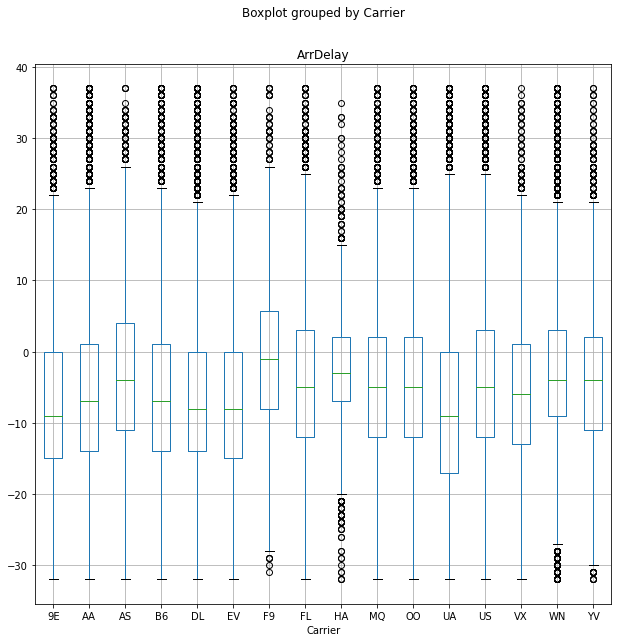

In [10]:
# To comapre Arrival Delays on the besis of Carrier
df_flights.boxplot(column = 'ArrDelay', by='Carrier', figsize=(10,10))

### **Is there a noticable difference in arrival delays for different days of the week?**

<AxesSubplot:title={'center':'ArrDelay'}, xlabel='DayOfWeek'>

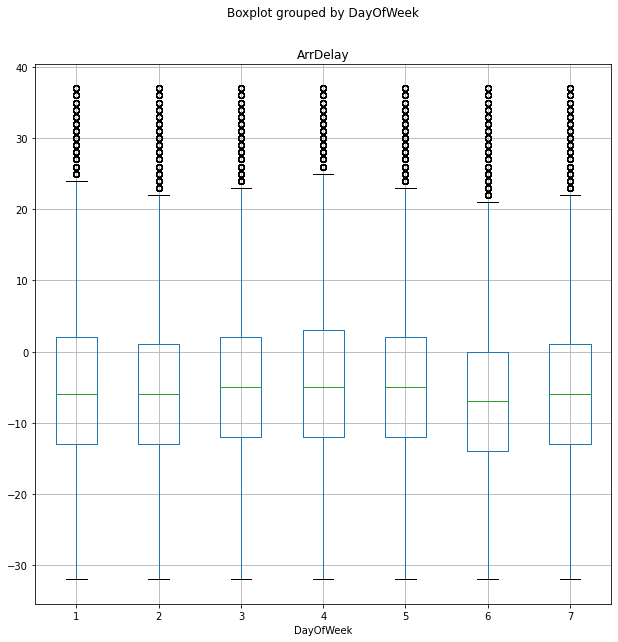

In [11]:
# To compare Arrival Delays for different days of week.
df_flights.boxplot(column='ArrDelay', by='DayOfWeek', figsize=(10,10))

### **Which departure airport has the highest average departure delay?**

,DepDelay
OriginAirportName,
Chicago Midway International,2.365960
Dallas Love Field,2.148798
William P Hobby,1.561927
Metropolitan Oakland International,0.964853
Denver International,0.807272
...,...
Memphis International,-2.962737
Tucson International,-2.989154
Ted Stevens Anchorage International,-3.149758


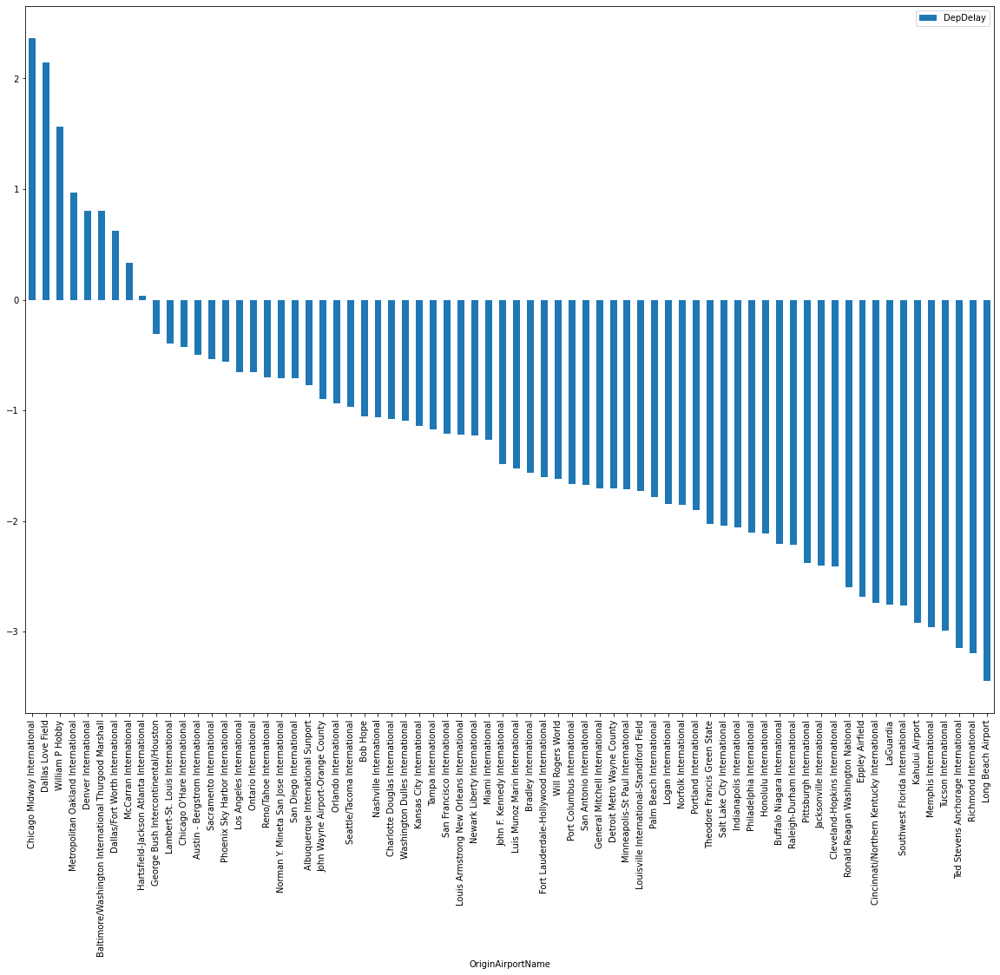

In [12]:
departure_airports = df_flights.groupby(df_flights.OriginAirportName)

mean_departureDelays = pd.DataFrame(departure_airports['DepDelay'].mean()).sort_values('DepDelay', ascending=False) #largest average delay time first

mean_departureDelays.plot(kind= "bar", figsize=(20,15))
mean_departureDelays

### **Do late departures tend to result in longer arrival delays than on-time departures?**

<AxesSubplot:title={'center':'ArrDelay'}, xlabel='DepDel15'>

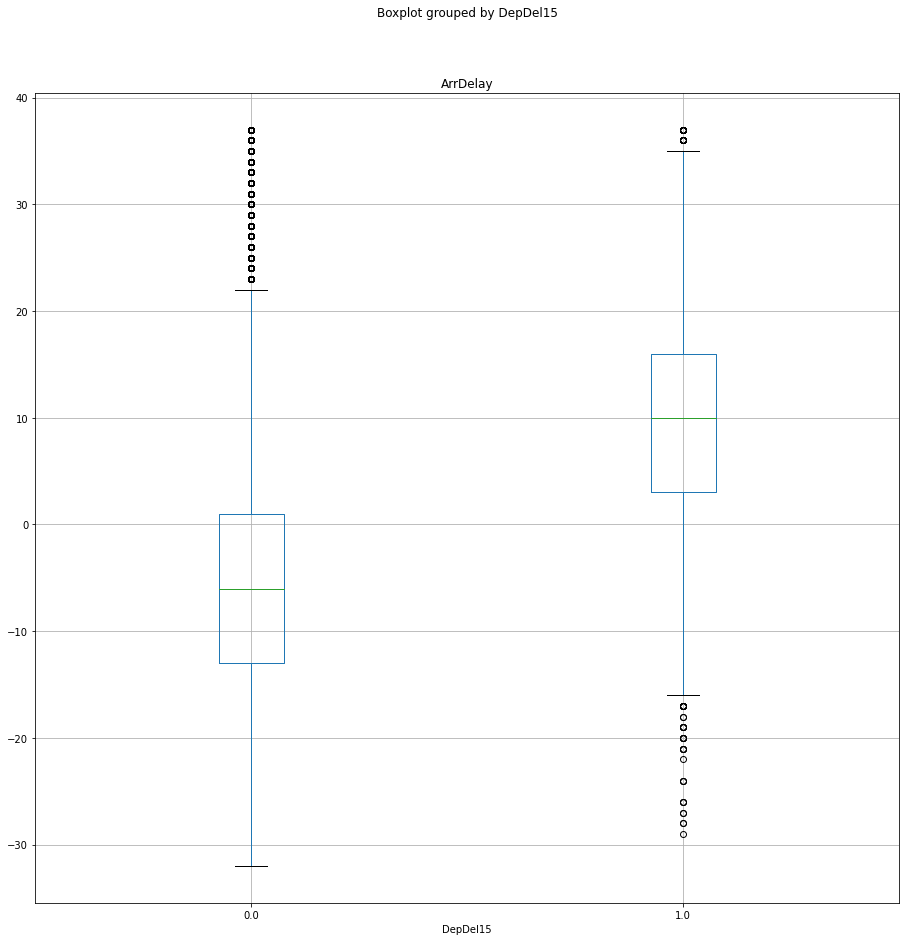

In [13]:
df_flights.boxplot(column='ArrDelay', by='DepDel15', figsize= (15,15)) #DepDel15 column represents late departures (departure delay more than 15 min.)

### **Which route (from origin airport to destination airport) has the most late arrivals?**

In [14]:
# Making a column for "Route"
Route = pd.Series(df_flights['OriginAirportName'] + '--->' + df_flights['DestAirportName'])
df_flights = pd.concat([df_flights, Route.rename("Routes")], axis =1)

# Grouping the routes
RouteGroups = df_flights.groupby(df_flights.Routes)
pd.DataFrame(RouteGroups['ArrDel15'].sum()).sort_values('ArrDel15', ascending=False) #it'll show number of times arrival was late (arrival delay more than 15 minutes)

,ArrDel15
Routes,
San Francisco International--->Los Angeles International,90
Los Angeles International--->San Francisco International,69
LaGuardia--->Hartsfield-Jackson Atlanta International,68
Los Angeles International--->John F. Kennedy International,52
LaGuardia--->Charlotte Douglas International,51
...,...
Logan International--->Austin - Bergstrom International,0
Logan International--->Memphis International,0
Logan International--->Port Columbus International,0


In [15]:
print('Hence, route with most number of LATE arrivals is \n' + pd.DataFrame(RouteGroups['ArrDel15'].sum()).sort_values('ArrDel15', ascending=False).index[0])

Hence, route with most number of LATE arrivals is 
San Francisco International--->Los Angeles International


### **Which route has the highest average arrival delay?**

In [16]:
pd.DataFrame(RouteGroups['ArrDelay'].mean()).sort_values('ArrDelay', ascending=False) #shows highest average delays in minutes.

,ArrDelay
Routes,
Louis Armstrong New Orleans International--->Ronald Reagan Washington National,24.500000
Cleveland-Hopkins International--->Palm Beach International,18.000000
John F. Kennedy International--->Louisville International-Standiford Field,18.000000
Cleveland-Hopkins International--->Philadelphia International,12.800000
Memphis International--->Denver International,9.758621
...,...
Lambert-St. Louis International--->Cleveland-Hopkins International,-20.000000
Eppley Airfield--->LaGuardia,-20.750000
Denver International--->Kahului Airport,-22.666667


In [17]:
print('Hence the route with highest arrival delay time is \n' + pd.DataFrame(RouteGroups['ArrDelay'].mean()).sort_values('ArrDelay', ascending=False).index[0])

Hence the route with highest arrival delay time is 
Louis Armstrong New Orleans International--->Ronald Reagan Washington National


Completed by Aman Poddar.